In [1]:
# ANALYSIS
library(vioplot)
library(stats)
options(stringsAsFactors = F)
dat <- read.csv("noQC_no_pop_specific_missingness.csv")
colnames(dat)

table(dat$Pop)
table(dat$predictedTissue)
dat_saliva <- dat[dat$predictedTissue %in% c("Saliva", "Blood PBMC", "Blood WB"),]
DAT <- dat_saliva
#DAT <- dat
DAT[DAT$Pop == "KHS", "Pop"] <- "Khomani San"
DAT[DAT$Pop == "HispanicLatino", "Pop"] <- "Hispanic"

table(DAT$Pop)
colnames(DAT)[which(names(DAT) == "Epigenetic.Age..Zhang.")] <- "Zhang"
colnames(DAT)[which(names(DAT) == "DNAmAge")] <- "Horvath"
colnames(DAT)[which(names(DAT) == "DNAmAgeHannum")] <- "Hannum"
colnames(DAT)[which(names(DAT) == "DNAmAgeSkinBloodClock")] <- "Skin and Blood Clock"

colnames(DAT)[which(names(DAT) == "DNAmPhenoAge")] <- "PhenoAge"
colnames(DAT)[which(names(DAT) == "DNAmFitAge")] <- "FitAge"
colnames(DAT)[which(names(DAT) == "DNAmGrimAgeBasedOnRealAge")] <- "GrimAge"
colnames(DAT)[which(names(DAT) == "DNAmGrimAge2BasedOnRealAge")] <- "GrimAge2"
colnames(DAT)[which(names(DAT) == "DNAmGrimAgeBasedOnPredictedAge")] <- "GrimAgepredicted"
colnames(DAT)[which(names(DAT) == "DNAmGrimAge2BasedOnPredictedAge")] <- "GrimAge2predicted"
# Verify the changes
# Verify the changes
chronagePredictions <- c("Horvath", "Hannum",  "Skin and Blood Clock", "Zhang")
mortPredictions <- c("PhenoAge", "GrimAge", "GrimAge2", "FitAge")
Predictions <- c("Horvath", "Hannum",  "Skin and Blood Clock", "Zhang", "PhenoAge", "GrimAge", "GrimAgepredicted", "GrimAge2", "GrimAge2predicted", "FitAge")

# Convert prediction columns to numeric
for (col in Predictions) {
  DAT[[col]] <- as.numeric(DAT[[col]])
}

# test for differences in age by predicted tissue
# boxplot(Age ~ predictedTissue, data=dat[dat$PredictedTissue %in% c("Saliva", "Buccal"),])
# anova(lm(Age ~ predictedTissue, data=dat[dat$PredictedTissue %in% c("Saliva", "Buccal"),]))
# t.test(x=dat[dat$predictedTissue=="Buccal", "Age"], y=dat[dat$predictedTissue=="Saliva", "Age"])
table(DAT$predictedTissue)

Loading required package: sm

Package 'sm', version 2.2-6.0: type help(sm) for summary information

Loading required package: zoo


Attaching package: 'zoo'


The following objects are masked from 'package:base':

    as.Date, as.Date.numeric




[1] "Pop"                                     
  [2] "SID"                                     
  [3] "OriginalOrderInBatch"                    
  [4] "Plate_Number"                            
  [5] "Well_Address"                            
  [6] "Sentrix_ID"                              
  [7] "Sentrix_Position"                        
  [8] "Age"                                     
  [9] "Tissue"                                  
 [10] "Sex"                                     
 [11] "Basename"                                
 [12] "Collection.Date"                         
 [13] "Row"                                     
 [14] "Col"                                     
 [15] "Comment"                                 
 [16] "noMissingPerSample"                      
 [17] "meanMethBySample"                        
 [18] "minMethBySample"                         
 [19] "maxMethBySample"                         
 [20] "corSampleVSgoldstandard"                 
 [21] "meanAbsDifferenceSampleVSgoldstandard"   
 [22] "meanXchromosome"                         
 [23] "Alcohol"                                 
 [24] "Body.Mass.Index"                         
 [25] "Body.Fat.."                              
 [26] "HDL.Cholesterol"                         
 [27] "Smoking"                                 
 [28] "Waist.Hip.Ratio"                         
 [29] "DNAmGait_noAge"                          
 [30] "DNAmGrip_noAge"                          
 [31] "DNAmVO2max"                              
 [32] "DNAmGait_wAge"                           
 [33] "DNAmGrip_wAge"                           
 [34] "DNAmFEV1_wAge"                           
 [35] "DNAmFEV1_noAge"                          
 [36] "CD8T"                                    
 [37] "CD4T"                                    
 [38] "NK"                                      
 [39] "Bcell"                                   
 [40] "Mono"                                    
 [41] "Gran"                                    
 [42] "PlasmaBlast"                             
 [43] "CD8pCD28nCD45RAn"                        
 [44] "CD8.naive"                               
 [45] "CD4.naive"                               
 [46] "PropNeuron"                              
 [47] "predictedTissue"                         
 [48] "ProbabilityFrom.X.Vasc.Endoth.Umbilical."
 [49] "ProbabilityFrom.Ape.WB"                  
 [50] "ProbabilityFrom.Blood.CD4.Tcells"        
 [51] "ProbabilityFrom.Blood.CD4.CD14"          
 [52] "ProbabilityFrom.Blood.Cell.Types"        
 [53] "ProbabilityFrom.Blood.Cord"              
 [54] "ProbabilityFrom.Blood.PBMC"              
 [55] "ProbabilityFrom.Blood.WB"                
 [56] "ProbabilityFrom.Bone"                    
 [57] "ProbabilityFrom.Brain.Cerebellar"        
 [58] "ProbabilityFrom.Brain.CRBLM"             
 [59] "ProbabilityFrom.Brain.FCTX"              
 [60] "ProbabilityFrom.Brain.Occipital.Cortex"  
 [61] "ProbabilityFrom.Brain.PONS"              
 [62] "ProbabilityFrom.Brain.Prefr.CTX"         
 [63] "ProbabilityFrom.Brain.TCTX"              
 [64] "ProbabilityFrom.Breast"                  
 [65] "ProbabilityFrom.Breast.NL"               
 [66] "ProbabilityFrom.Buccal"                  
 [67] "ProbabilityFrom.Cartilage.Knee"          
 [68] "ProbabilityFrom.Colon"                   
 [69] "ProbabilityFrom.Dermal.fibroblast"       
 [70] "ProbabilityFrom.Epidermis"               
 [71] "ProbabilityFrom.Fat.Adip"                
 [72] "ProbabilityFrom.Gastric"                 
 [73] "ProbabilityFrom.GlialCell"               
 [74] "ProbabilityFrom.Head.Neck"               
 [75] "ProbabilityFrom.Heart"                   
 [76] "ProbabilityFrom.Kidney"                  
 [77] "ProbabilityFrom.Liver"                   
 [78] "ProbabilityFrom.Liver."                  
 [79] "ProbabilityFrom.Lung"                    
 [80] "ProbabilityFrom.MSC"                     
 [81] "ProbabilityFrom.Muscle"                  
 [82] "ProbabilityFrom.Neuron"   


          Baka       European          Himba HispanicLatino            KHS 
            35            166             52             93             52 


Blood PBMC   Blood WB     Buccal  Head+Neck     Saliva 
        17          4         68          1        308 


       Baka    European       Himba    Hispanic Khomani San 
         35         130          49          69          46 


Blood PBMC   Blood WB     Saliva 
        17          4        308 


Attaching package: 'dplyr'


The following objects are masked from 'package:stats':

    filter, lag


The following objects are masked from 'package:base':

    intersect, setdiff, setequal, union




[1] 329


Warning message:
"The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
i Please use the `linewidth` argument instead."
Warning message:
"Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
i Please use `linewidth` instead."
Warning message:
"The `fun.y` argument of `stat_summary()` is deprecated as of ggplot2 3.3.0.
i Please use the `fun` argument instead."
Warning message:
"The `guide` argument in `scale_*()` cannot be `FALSE`. This was deprecated in ggplot2 3.3.4.
i Please use "none" instead."


                      Himba Khomani San Baka Hispanic European
Horvath               -0.34       -1.10 0.00    -1.15     1.13
Hannum                -4.55       -1.99 0.43     1.34     1.59
Skin and Blood Clock  -6.53       -0.68 1.74     1.09     1.65
Zhang                 -2.36       -1.09 0.35     0.54     0.90
PhenoAge             -10.23       -0.16 4.14     0.89     2.33
GrimAge               -0.73        7.55 4.84    -1.41    -2.95
GrimAgepredicted      -4.94        7.11 5.97    -0.71    -1.89
GrimAge2               0.50        6.94 3.92    -1.17    -3.08
GrimAge2predicted     -3.34        6.54 4.95    -0.53    -2.10
FitAge                -1.60        4.33 2.42    -0.87    -1.14
                     Khomani San vs European Khomani San vs Hispanic
Horvath                         2.482220e-02            6.789468e-01
Hannum                          1.726663e-04            3.132830e-03
Skin and Blood Clock            1.128565e-02            1.019188e-01
Zhang                          

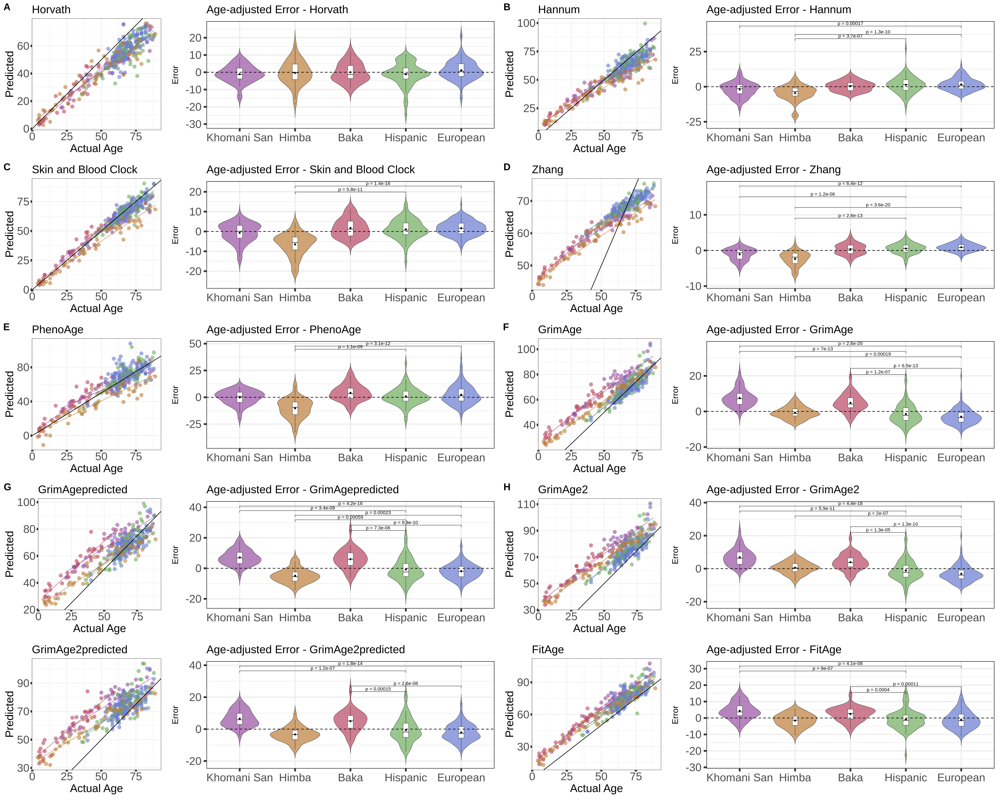

In [2]:
library(ggplot2)
library(dplyr)
library(cowplot)
library(ggsignif)
print(nrow(DAT))
# Update Predictions list
Predictions <- c("Horvath", "Hannum", "Skin and Blood Clock", "Zhang", "PhenoAge", "GrimAge", "GrimAgepredicted", "GrimAge2", "GrimAge2predicted", "FitAge")

# Define the colors for the populations
popColours <- c(
  rgb(151/255, 80/255, 161/255, alpha=0.7), # purple/magenta
  rgb(188/255, 125/255, 57/255, alpha=0.7), # orange
  rgb(185/255, 70/255, 99/255, alpha=0.7),  # red
  rgb(111/255, 172/255, 93/255, alpha=0.7), # green
  rgb(103/255, 122/255, 209/255, alpha=0.7) # blue
)

# Ensure your Pop column is a factor and ordered correctly
DAT$Pop <- factor(DAT$Pop, levels = c("Khomani San", "Himba", "Baka", "Hispanic", "European"))

# Convert prediction columns to numeric (if not already done)
for (col in Predictions) {
  DAT[[col]] <- as.numeric(DAT[[col]])
}

# Function to calculate mean and median for each group
mean_median_df <- function(df, metric) {
  result <- df %>%
    group_by(Pop) %>%
    summarise(mean = mean(Error), median = median(Error)) %>%
    mutate(metric = metric)
  return(result)
}

# Initialize a list to store plots
plot_list <- list()

mean_errors_df <- data.frame(matrix(ncol = 5, nrow = 10))
abs_mean_errors_df <- data.frame(matrix(ncol = 5, nrow = 10))
p_values_df <- data.frame(matrix(ncol = 6, nrow = 10))

colnames(mean_errors_df) <- c("Himba","Khomani San", "Baka", "Hispanic", "European")
rownames(mean_errors_df) <- c("Horvath", "Hannum","Skin and Blood Clock", "Zhang", "PhenoAge", "GrimAge", "GrimAgepredicted", "GrimAge2", "GrimAge2predicted", "FitAge")

colnames(abs_mean_errors_df) <- c( "Himba","Khomani San", "Baka", "Hispanic", "European")
rownames(abs_mean_errors_df) <- c("Horvath", "Hannum","Skin and Blood Clock", "Zhang", "PhenoAge", "GrimAge", "GrimAgepredicted", "GrimAge2", "GrimAge2predicted", "FitAge")

colnames(p_values_df) <- c("Khomani San vs European", "Khomani San vs Hispanic", "Himba vs European", "Himba vs Hispanic", "Baka vs European", "Baka vs Hispanic")
rownames(p_values_df) <- c("Horvath", "Hannum","Skin and Blood Clock", "Zhang", "PhenoAge", "GrimAge", "GrimAgepredicted", "GrimAge2", "GrimAge2predicted", "FitAge")

# Analyzing Residuals for each metric
for (metric in Predictions) {
  DAT[, paste0(metric, "_error")] <- DAT[, metric] - DAT$Age
  NAs <- which(is.na(DAT[, paste0(metric, "_error")]))
  
  if (length(NAs) > 0) {
    error_data <- lm(DAT[-NAs, paste0(metric, "_error")] ~ DAT$Age[-NAs])$resid
    pop_data <- DAT$Pop[-NAs]
  } else {
    error_data <- lm(DAT[, paste0(metric, "_error")] ~ DAT$Age)$resid
    pop_data <- DAT$Pop
  }
  
  error_df <- data.frame(Pop = pop_data, Error = error_data)
  mean_errors_by_pop <- aggregate(Error ~ Pop, data = error_df, mean)

  # Store mean errors in the data frame
  for (pop in mean_errors_by_pop$Pop) {
    mean_errors_df[metric, pop] <- round(mean_errors_by_pop[mean_errors_by_pop$Pop == pop, "Error"],2)
    abs_mean_errors_df[metric, pop] <- abs(round(mean_errors_by_pop[mean_errors_by_pop$Pop == pop, "Error"],2))
  }

  
  plot_data <- DAT %>% filter(is.finite(Age), is.finite(.data[[metric]]))
  
  # Scatter plot without legend
  scatter_plot <- ggplot(plot_data, aes(x = Age, y = .data[[metric]], color = Pop)) +
    geom_point(alpha = 0.6, size = 6, show.legend = FALSE) +  # Increased point size
    geom_smooth(method = "lm", se = FALSE, formula = y ~ x) +
    labs(title = paste(metric), x = "Actual Age", y = "Predicted") +
    scale_color_manual(values = popColours, guide = FALSE) +  # Hide legend
    theme_bw(base_size = 20) +  # Increase base size for all elements
    theme(
      text = element_text(size = 40),  # Increase text size for all text elements
      axis.text = element_text(size = 40),  
      plot.title = element_text(size = 40),# Increase axis text size
      axis.title = element_text(size = 40),  # Increase axis title size
      axis.ticks = element_line(size = 4),  # Increase axis tick size
      plot.margin = margin(20, 20, 20, 20, "pt")  # Add margins around the plot
    ) +
    geom_abline(slope = 1, intercept = 0, linetype = "solid", size = 1)


  # Violin plot with box plot overlay
  violin_plot <- ggplot(error_df, aes(x = Pop, y = Error, fill = Pop)) +
    geom_violin(trim = FALSE, alpha = 0.7) +
    geom_boxplot(width = 0.1, position = position_dodge(0.9), fill = "white", outlier.size = 0.5) +
    scale_fill_manual(values = popColours, guide = FALSE) +  # Hide legend
    labs(title = paste("Age-adjusted Error -", metric), y = "Error", x = "") +
    theme_bw(base_size = 40) +  # Increase base size for all elements
    theme(
      text = element_text(size = 40),  # Increase text size for all text elements
      axis.text = element_text(size = 40),  # Increase axis text size
      axis.title = element_text(size = 30), 
      plot.title = element_text(size = 40),# Increase axis title size
      axis.ticks = element_line(size = 3),  # Increase axis tick size
      plot.margin = margin(20, 20, 20, 20, "pt")  # Add margins around the plot
    ) +
    geom_hline(yintercept = 0, linetype = "dashed", size = 1) +
    stat_summary(fun.y = mean, geom = "point", shape = 18, size = 4, color = "black", position = position_dodge(0.9))   # Add mean points
  
  # Add significance brackets
  significance_pairs <- list(
    c("Khomani San", "European"),
    c("Khomani San", "Hispanic"),
    c("Himba", "European"),
    c("Himba", "Hispanic"),
    c("Baka", "European"),
    c("Baka", "Hispanic")
  )
  
  position_adjustments <- list(
    c(max(error_df$Error) + 14, max(error_df$Error) + 13),  # KHS vs European
    c(max(error_df$Error) + 11, max(error_df$Error) + 10),  # KHS vs HispanicLatino
    c(max(error_df$Error) + 8, max(error_df$Error) + 7),    # Himba vs European
    c(max(error_df$Error) + 5, max(error_df$Error) + 4),    # Himba vs HispanicLatino
    c(max(error_df$Error) + 2, max(error_df$Error)),        # Baka vs European
    c(max(error_df$Error) - 2, max(error_df$Error) - 3)      # Baka vs HispanicLatino
  )
  
  for (i in seq_along(significance_pairs)) {
    pair <- significance_pairs[[i]]
    adj <- position_adjustments[[i]]
    
    p_value <- wilcox.test(error_df$Error[error_df$Pop == pair[1]], error_df$Error[error_df$Pop == pair[2]])$p.value
    p_values_df[metric, i] <- p_value
    
    if (p_value <= 0.001) {  # Adjust significance level threshold here
      violin_plot <- violin_plot + 
        geom_signif(comparisons = list(pair), map_signif_level = function(p) sprintf("p = %.2g", p),
                    test = "wilcox.test", textsize = 6, y_position = mean(adj))  
    }
  }
  
  # Save each combined plot as the name of the metric
  assign(paste0(metric, "_plot"), plot_grid(scatter_plot, violin_plot, ncol = 2, rel_widths = c(1, 2)))
  
  # Store plots in a list
  plot_list[[metric]] <- plot_grid(scatter_plot, violin_plot, ncol = 2, rel_widths = c(1, 2))
}

# Combine all metric plots into one plot grid
combined_plots <- plot_grid(plotlist = plot_list, ncol = 2, align = "hv", labels = c("A", "B", "C", "D", "E", "F", "G", "H"), label_size = 35)
options(repr.plot.width = 50, repr.plot.height = 40)

# Print or save the combined plot
print(combined_plots)
print(mean_errors_df)
print(p_values_df)
write.csv(mean_errors_df, "mean_adj_errors_by_population.csv", row.names = TRUE)
write.csv(abs_mean_errors_df, "abs_mean_adj_errors_by_population.csv", row.names = TRUE)
write.csv(p_values_df, "p_values_by_population.csv", row.names = TRUE)

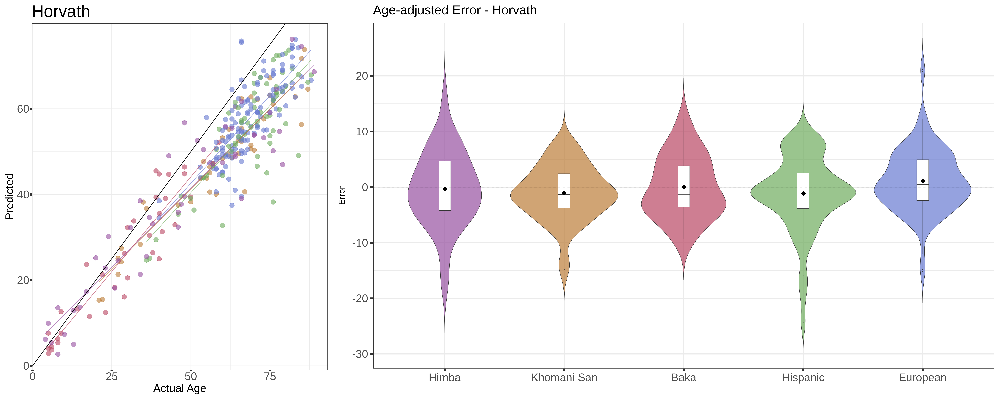

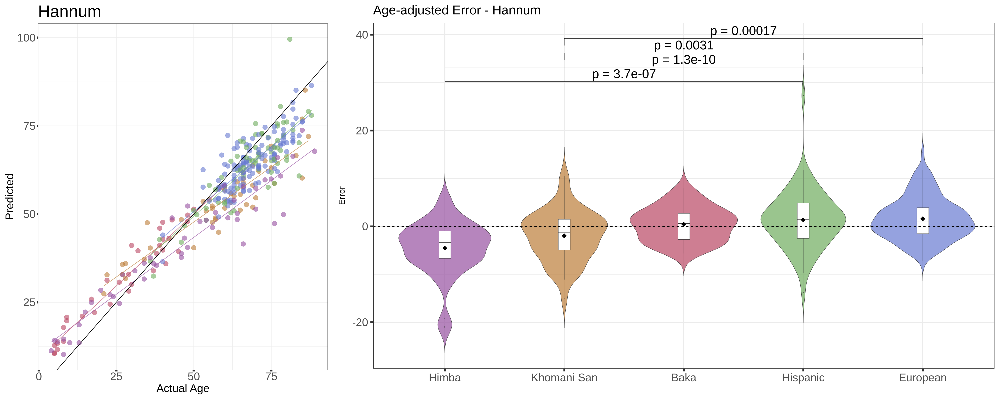

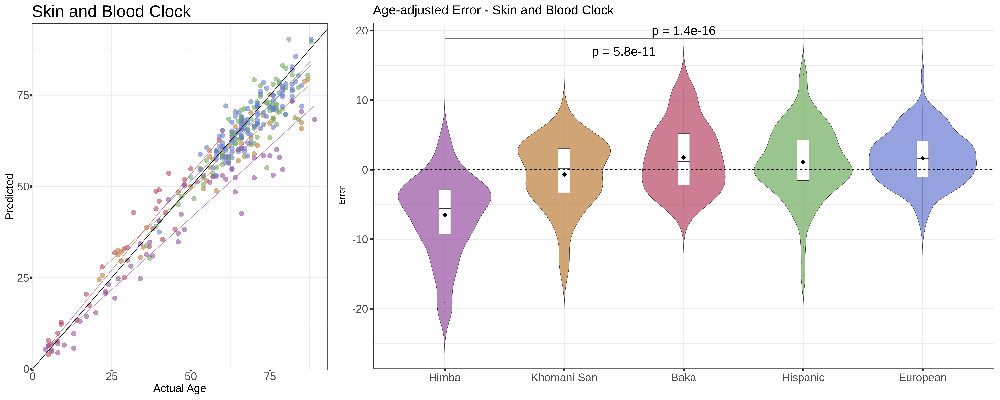

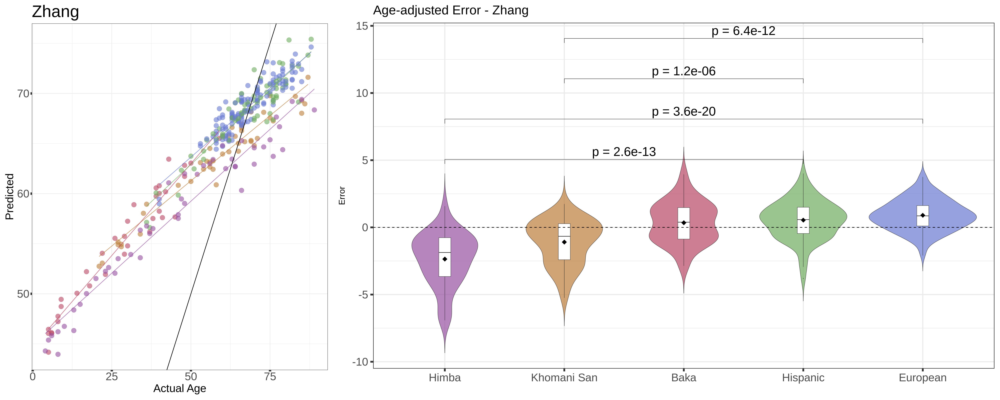

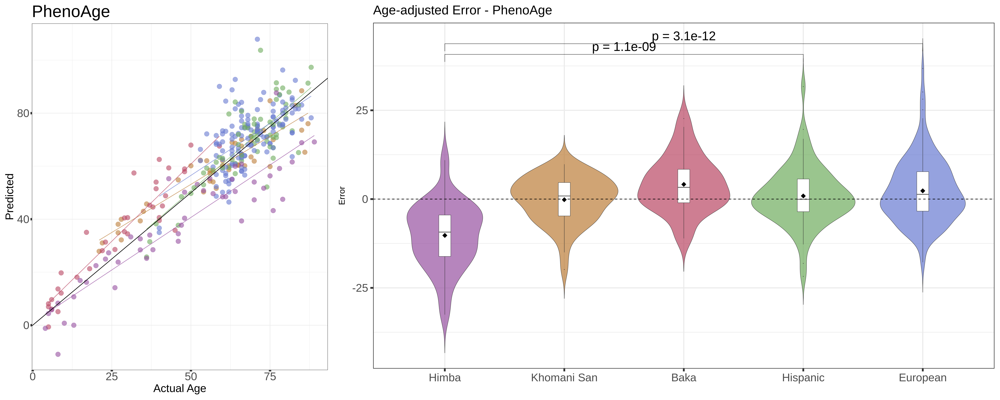

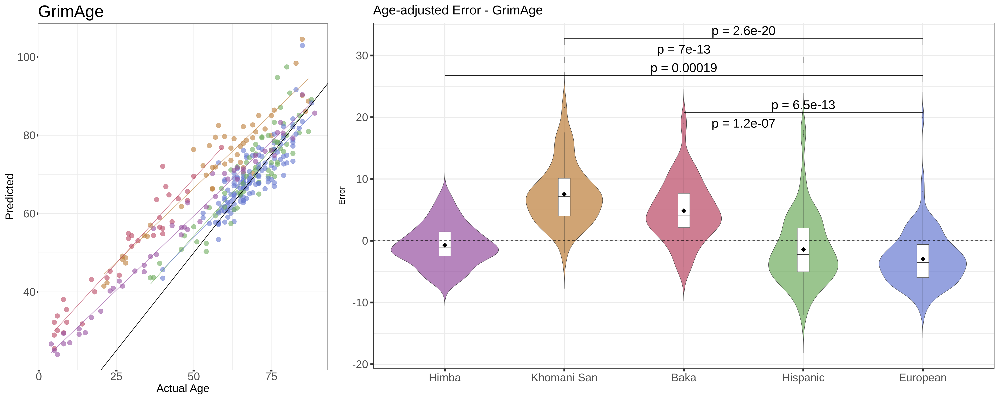

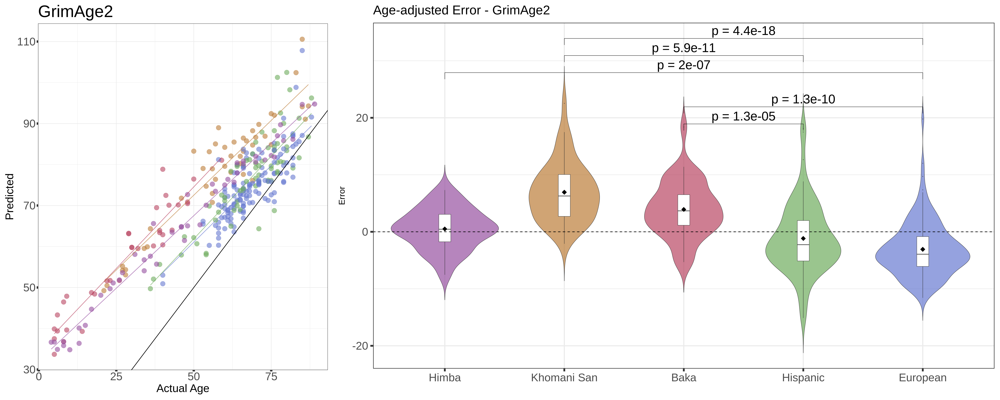

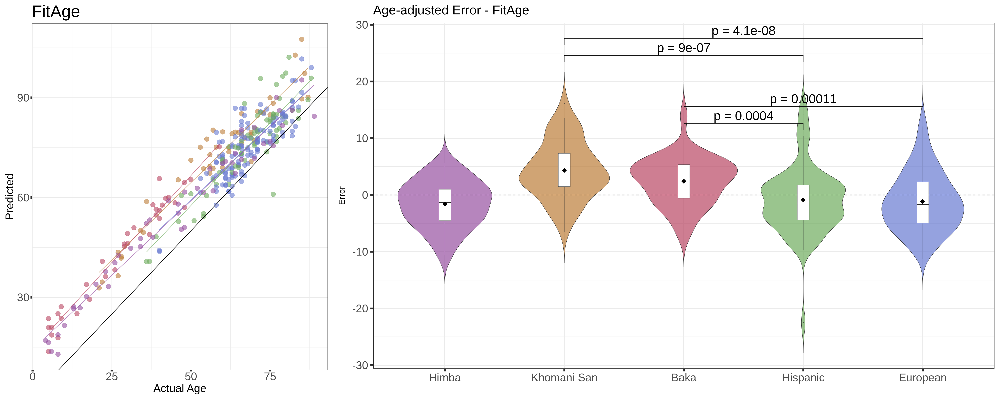

In [3]:
library(ggplot2)
library(dplyr)
library(cowplot)
library(ggsignif)
######Plot one at a time
# Update Predictions list
Predictions <- c("Horvath", "Hannum", "Skin and Blood Clock", "Zhang", "PhenoAge", "GrimAge", "GrimAge2", "FitAge")

# Define the colors for the populations
popColours <- c(
  rgb(151/255, 80/255, 161/255, alpha=0.7), # purple/magenta
  rgb(188/255, 125/255, 57/255, alpha=0.7), # orange
  rgb(185/255, 70/255, 99/255, alpha=0.7),  # red
  rgb(111/255, 172/255, 93/255, alpha=0.7), # green
  rgb(103/255, 122/255, 209/255, alpha=0.7) # blue
)

# Ensure your Pop column is a factor and ordered correctly
DAT$Pop <- factor(DAT$Pop, levels = c( "Himba","Khomani San", "Baka", "Hispanic", "European"))

# Convert prediction columns to numeric (if not already done)
for (col in Predictions) {
  DAT[[col]] <- as.numeric(DAT[[col]])
}

# Function to calculate mean and median for each group
mean_median_df <- function(df, metric) {
  result <- df %>%
    group_by(Pop) %>%
    summarise(mean = mean(Error), median = median(Error)) %>%
    mutate(metric = metric)
  return(result)
}

# Initialize a list to store plots
plot_list <- list()

# Analyzing Residuals for each metric
for (metric in Predictions) {
  DAT[, paste0(metric, "_error")] <- DAT[, metric] - DAT$Age
  NAs <- which(is.na(DAT[, paste0(metric, "_error")]))
  
  if (length(NAs) > 0) {
    error_data <- lm(DAT[-NAs, paste0(metric, "_error")] ~ DAT$Age[-NAs])$resid
    pop_data <- DAT$Pop[-NAs]
  } else {
    error_data <- lm(DAT[, paste0(metric, "_error")] ~ DAT$Age)$resid
    pop_data <- DAT$Pop
  }
  
  error_df <- data.frame(Pop = pop_data, Error = error_data)
  
  plot_data <- DAT %>% filter(is.finite(Age), is.finite(.data[[metric]]))
  
  # Scatter plot without legend
  scatter_plot <- ggplot(plot_data, aes(x = Age, y = .data[[metric]], color = Pop)) +
    geom_point(alpha = 0.6, size = 8, show.legend = FALSE) +  # Increased point size
    geom_smooth(method = "lm", se = FALSE, formula = y ~ x) +
    labs(title = paste(metric), x = "Actual Age", y = "Predicted") +
    scale_color_manual(values = popColours, guide = FALSE) +  # Hide legend
    theme_bw(base_size = 20) +  # Increase base size for all elements
    theme(
      text = element_text(size = 40),  # Increase text size for all text elements
      axis.text = element_text(size = 40),  
      plot.title = element_text(size = 60),# Increase axis text size
      axis.title = element_text(size = 40),  # Increase axis title size
      axis.ticks = element_line(size = 4),  # Increase axis tick size
      plot.margin = margin(20, 20, 20, 20, "pt")  # Add margins around the plot
    ) +
    geom_abline(slope = 1, intercept = 0, linetype = "solid", size = 1)
  
  # Violin plot with box plot overlay
  violin_plot <- ggplot(error_df, aes(x = Pop, y = Error, fill = Pop)) +
    geom_violin(trim = FALSE, alpha = 0.7) +
    geom_boxplot(width = 0.1, position = position_dodge(0.9), fill = "white", outlier.size = 0.5) +
    scale_fill_manual(values = popColours, guide = FALSE) +  # Hide legend
    labs(title = paste("Age-adjusted Error -", metric), y = "Error", x = "") +
    theme_bw(base_size = 40) +  # Increase base size for all elements
    theme(
      text = element_text(size = 40),  # Increase text size for all text elements
      axis.text = element_text(size = 40),  # Increase axis text size
      axis.title = element_text(size = 30), 
      plot.title = element_text(size = 46),# Increase axis title size
      axis.ticks = element_line(size = 3),  # Increase axis tick size
      plot.margin = margin(20, 20, 20, 20, "pt")  # Add margins around the plot
    ) +
    geom_hline(yintercept = 0, linetype = "dashed", size = 1) +
    stat_summary(fun.y = mean, geom = "point", shape = 18, size = 8, color = "black", position = position_dodge(0.9))   # Add mean points
  
  # Add significance brackets
  significance_pairs <- list(
    c("Khomani San", "European"),
    c("Khomani San", "Hispanic"),
    c("Himba", "European"),
    c("Himba", "Hispanic"),
    c("Baka", "European"),
    c("Baka", "Hispanic")
  )
  
  position_adjustments <- list(
    c(max(error_df$Error) + 10, max(error_df$Error) + 9),  # KHS vs European
    c(max(error_df$Error) + 7, max(error_df$Error) + 6),  # KHS vs HispanicLatino
    c(max(error_df$Error) + 4, max(error_df$Error) +3 ),    # Himba vs European
    c(max(error_df$Error) +1, max(error_df$Error) ),    # Himba vs HispanicLatino
    c(max(error_df$Error) -2, max(error_df$Error) -3),        # Baka vs European
    c(max(error_df$Error) - 5, max(error_df$Error) - 6)      # Baka vs HispanicLatino
  )
  
  for (i in seq_along(significance_pairs)) {
    pair <- significance_pairs[[i]]
    adj <- position_adjustments[[i]]
    
    p_value <- wilcox.test(error_df$Error[error_df$Pop == pair[1]], error_df$Error[error_df$Pop == pair[2]])$p.value
    
    if (p_value < 0.00833) {  # Adjust significance level threshold here
      violin_plot <- violin_plot + 
     geom_signif(comparisons = list(pair), map_signif_level = function(p) sprintf("p = %.2g", p),
                    test = "wilcox.test", textsize = 16, y_position = mean(adj))  
    }
  }
  options(repr.plot.width = 50, repr.plot.height = 20)
  print(plot_grid(scatter_plot, violin_plot, ncol = 2, rel_widths = c(1, 2)))
  
 

}



In [4]:

# library(ggplot2)

# # Number of samples per genotype
# n <- 50

# # Generate fake data
# genotypes <- rep(c("AA", "AT", "TT"), each = n)
# methylation <- c(
#   rnorm(n, mean = 0.25, sd = 0.05),  # AA
#   rnorm(n, mean = 0.50, sd = 0.05),  # AT
#   rnorm(n, mean = 0.75, sd = 0.05)   # TT
# )

# # Create a data frame
# data <- data.frame(Genotype = genotypes, MethylationPercent = methylation)

# # Plot the data
# ggplot(data, aes(x = Genotype, y = MethylationPercent)) +
#   geom_boxplot(aes(fill = Genotype)) +
#   geom_jitter(width = 0.2, alpha = 0.5, size = 3) +
#   labs(title = "CpG methylation by Genotype",
#        x = "Genotype",
#        y = "Methylation Percent") +
#   theme_minimal() +
#   theme(
#     text = element_text(size = 26),           # Increase font size of all text
#     axis.title = element_text(size = 26),     # Increase font size of axis titles
#     axis.text = element_text(size = 26),      # Increase font size of axis labels
#     plot.title = element_text(size=35),     # Increase font size of plot title
#     legend.position = "none"                  # Remove legend
#   ) +
#   scale_fill_manual(values = c("AA" = "#E69F00", "AT" = "#56B4E9", "TT" = "#004949"))  # Change the colors


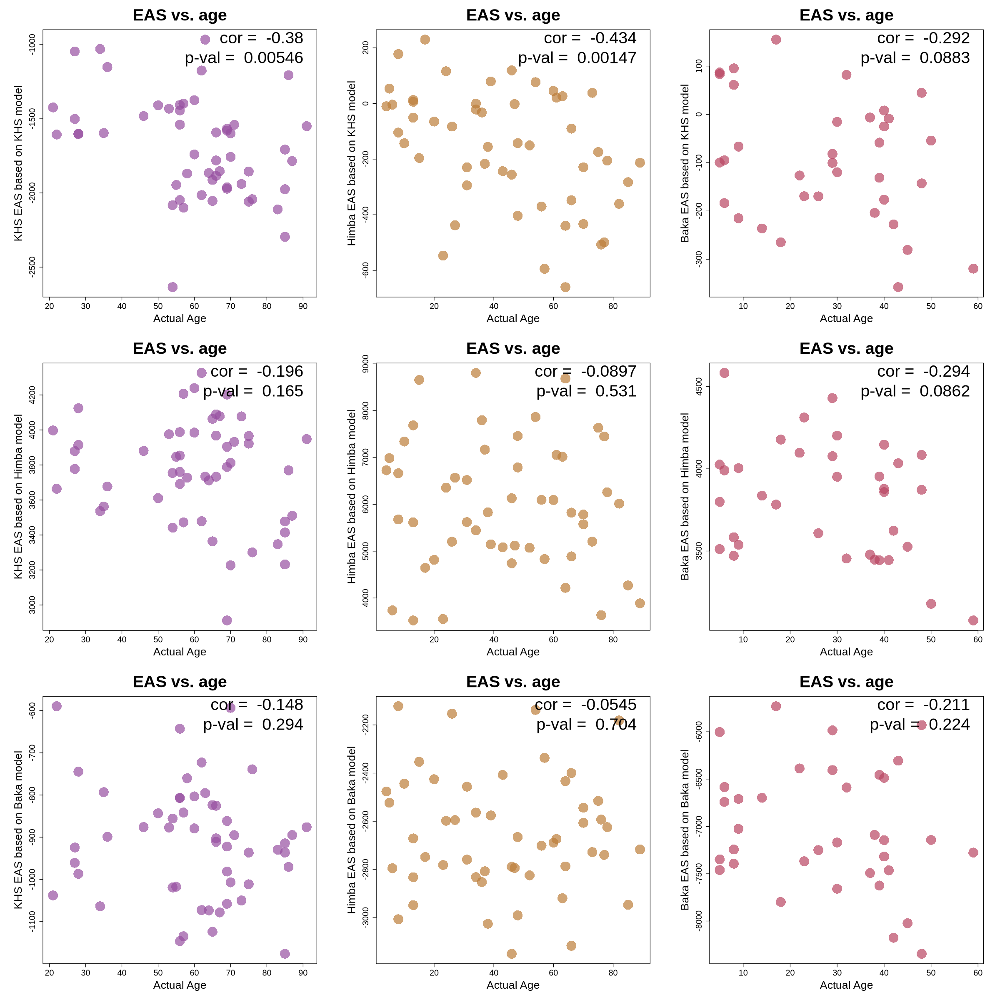

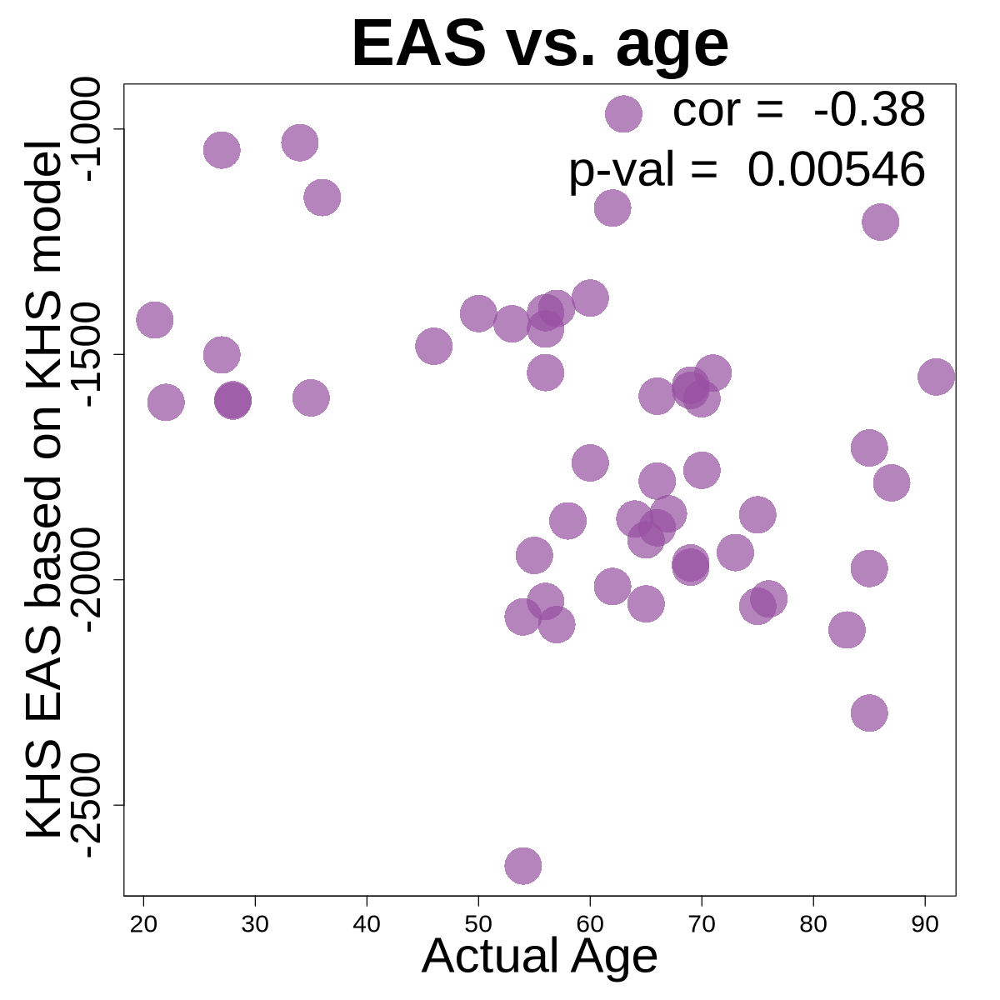

In [5]:
# get age, plot against EAS
options(stringsAsFactors=F)
options(repr.plot.width = 20, repr.plot.height = 20)

ages <- read.delim("epi_aging_score/model_dat/age_all.txt", sep="", header=FALSE)[,2:3]
ids <- ages[,1]
ages <- as.data.frame(ages[,-1])
colnames(ages) <- "age"
rownames(ages) <- ids

par(mfrow = c(3, 3), mar = c(5, 6, 4, 2) + 0.5)  # Adjust margins

for (model in c("KHS", "Himba", "Baka")) {
    for (test in c("KHS", "Himba", "Baka")) {
        test_pop <- test
        model_pop <- model
        
        if (test_pop == "KHS") {
            color <- rgb(151/255, 80/255, 161/255, alpha = 0.7)
        } else if (test_pop == "Baka") {
            color <- rgb(185/255, 70/255, 99/255, alpha = 0.7)
        } else if (test_pop == "Himba") {
            color <- rgb(188/255, 125/255, 57/255, alpha = 0.7)
        }
        
        EAS_df <- read.csv(paste0("epi_aging_score/model_dat/", test_pop, "_EAS_using_", model_pop, "_model.csv"), header = TRUE, row.names = 1)
        EAS <- as.data.frame(apply(EAS_df, MARGIN = 1, FUN = sum, na.rm = TRUE))
        age_dat <- ages[rownames(EAS), ]
        EAS <- EAS[!is.na(age_dat), ]
        age_dat <- age_dat[!is.na(age_dat)]
        
        plot(age_dat, EAS, 
             xlab = "Actual Age", 
             ylab = paste(test, "EAS based on", model_pop, "model"), 
             main = "EAS vs. age", 
             cex = 4, 
             pch = 16, 
             col = color, 
             cex.main = 3,  # Main title font size
             cex.lab = 2,   # Axis labels font size
             cex.axis = 1.5)  # Axis ticks font size
        
        cor_test <- cor.test(age_dat, EAS)
        
        text(x = max(age_dat), y = max(EAS), 
             labels = paste("cor = ", signif(cor_test$estimate, 3)), 
             pos = 2, 
             cex = 3)
        
        text(x = max(age_dat), y = (max(EAS) - min(EAS)) * 0.92 + min(EAS), 
             labels = paste("p-val = ", signif(cor_test$p.value, 3)), 
             pos = 2, 
             cex = 3)
    }
}


par(mfrow=c(1, 1), mar=c(5, 6, 4, 2) + 0.2) # Adjust margins
options(repr.plot.width = 10, repr.plot.height = 10)

for(model in c("KHS")){
    for(test in c("KHS")){
        test_pop <- test
        model_pop <- model
        if(test_pop == "KHS"){color =  rgb(151/255, 80/255, 161/255, alpha=0.7)}
        if(test_pop == "Baka"){color = rgb(185/255, 70/255, 99/255, alpha=0.7) }
        if(test_pop == "Himba"){color = rgb(188/255, 125/255, 57/255, alpha=0.7)}


        EAS_df <- read.csv(paste0("epi_aging_score/model_dat/", test_pop, "_EAS_using_", model_pop, "_model.csv"), header=T, row.names=1)
        EAS <- as.data.frame(apply(EAS_df, MARGIN=1, FUN=sum, na.rm=T))
        age_dat <- ages[rownames(EAS),]
        EAS <- EAS[!is.na(age_dat),]
        age_dat <- age_dat[!is.na(age_dat)]

        
        plot(age_dat, EAS, 
             xlab="Actual Age", 
             ylab=paste(test, "EAS based on", model_pop, "model"), 
             main="EAS vs. age", 
             cex=5, 
             pch=16, 
             col=color, 
             cex.main=4,  # Main title font size
             cex.lab=3,   # Axis labels font size
             cex.axis=2.5,  # Axis ticks font size
             xlim=c(min(age_dat), 90), # Set x-axis limits
             xaxt='n') # Disable default x-axis ticks
        
 if (test_pop == "KHS") {
  axis(1, at = seq(10, 90, by = 10), labels = seq(10, 90, by = 10), cex.axis = 1.5)
} else if (test_pop == "Himba") {
  axis(1, at = seq(0, 90, by = 10), labels = seq(0, 90, by = 10), cex.axis = 1.5)
}
 if (test_pop == "Baka") {
  axis(1, at = seq(0, 90, by = 10), labels = seq(0, 90, by = 10), cex.axis = 1.5)
}
        cor_test <- cor.test(age_dat, EAS)
        
        text(x=max(age_dat), y=max(EAS), 
             labels=paste("cor = ", signif(cor_test$estimate, 3)), 
             pos=2, 
             cex=3)
        
        text(x=max(age_dat), y=(max(EAS)-min(EAS))*.92 + min(EAS), 
             labels=paste("p-val = ", signif(cor_test$p.value, 3)), 
             pos=2, 
             cex=3)
    }
}

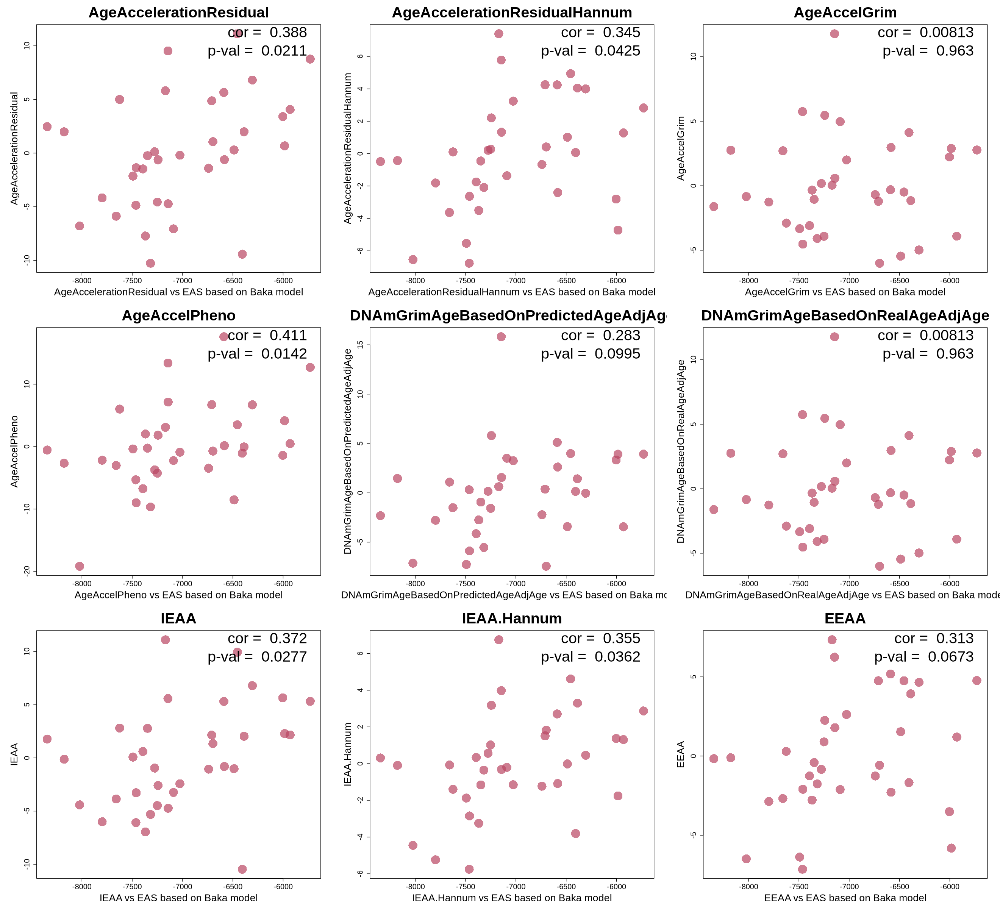

[1] 52
[1] 52


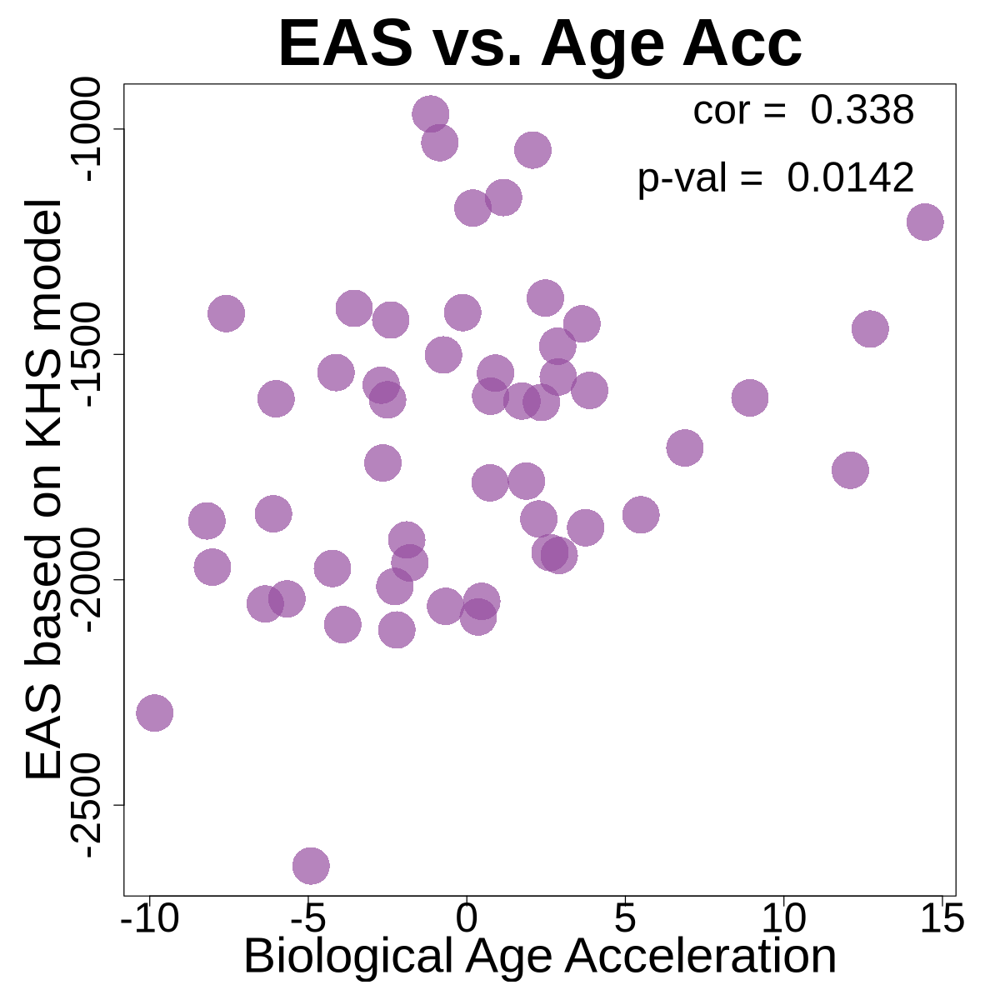

In [6]:
par(mfrow=c(3, 3), mar=c(5, 6, 4, 2) + 0.1) # Adjust margins
options(repr.plot.width = 22, repr.plot.height = 20)

for(test in c("Baka")){

        test_pop <- test
        model_pop <- test
             if(test_pop == "KHS"){color =  rgb(151/255, 80/255, 161/255, alpha=0.7)}
        if(test_pop == "Baka"){color = rgb(185/255, 70/255, 99/255, alpha=0.7) }
        if(test_pop == "Himba"){color = rgb(188/255, 125/255, 57/255, alpha=0.7)}
        EAS_df <- read.csv(paste0("epi_aging_score/model_dat/", test_pop, "_EAS_using_", model_pop, "_model.csv"), header=T, row.names=1)
        EAS <- as.data.frame(apply(EAS_df, MARGIN=1, FUN=sum, na.rm=T))
        age_dat <- ages[rownames(EAS),]
        EAS <- EAS[!is.na(age_dat),]
        age_dat <- age_dat[!is.na(age_dat)]
        
        # EAS vs. epigenetic age acceleration metrics, computed from DNA methylation data
        ageAccelMetrics <- c("AgeAccelerationResidual", "AgeAccelerationResidualHannum", "AgeAccelGrim", "AgeAccelPheno", 
                             "DNAmGrimAgeBasedOnPredictedAgeAdjAge", "DNAmGrimAgeBasedOnRealAgeAdjAge", "IEAA", 
                             "IEAA.Hannum", "EEAA")
        
        online_clock_results <- read.csv("noQC_no_pop_specific_missingness.csv")
        if(test_pop == "Himba") {online_clock_results <- online_clock_results[!online_clock_results$SID == "HMB181_2",]}
        online_clock_results$SID <- gsub("HMB494.2", "HMB494-2", online_clock_results$SID)
        online_clock_results <- online_clock_results[online_clock_results$Pop == test_pop,] # filter to test_pop results
        online_clock_results <- online_clock_results[match(rownames(EAS_df), online_clock_results$SID),] # re-order samples
        
        # these tend to increase with increasing EAS - pick your favourite one
        for (metric in ageAccelMetrics) {
            plot(EAS, online_clock_results[,metric], 
                 xlab=paste(metric, "vs EAS based on", model_pop, "model"), 
                 ylab=metric, 
                 main=metric, 
                 cex=4, 
                 pch=16, 
                 col=color, 
                 cex.main=3,  # Main title font size
                 cex.lab=2,   # Axis labels font size
                 cex.axis=1.5)  # Axis ticks font size
            
            cor_test <- cor.test(EAS, online_clock_results[,metric])
            
            text(x=max(EAS), y=max(online_clock_results[,metric]), 
                 labels=paste("cor = ", signif(cor_test$estimate, 3)), 
                 pos=2, 
                 cex=3)
            
            text(x=max(EAS), y=(max(online_clock_results[,metric])-min(online_clock_results[,metric]))*.92 + min(online_clock_results[,metric]), 
                 labels=paste("p-val = ", signif(cor_test$p.value, 3)), 
                 pos=2, 
                 cex=3)
        }


    }



par(mfrow=c(1, 1), mar=c(5, 6, 4, 2) + 0.2) # Adjust margins
options(repr.plot.width = 10, repr.plot.height = 10)

for(test in c("KHS")){

    test_pop <- test
    model_pop <- test
    if(test_pop == "KHS"){color =  rgb(151/255, 80/255, 161/255, alpha=0.7)}
    if(test_pop == "Baka"){color = rgb(185/255, 70/255, 99/255, alpha=0.7)}
    if(test_pop == "Himba"){color = rgb(188/255, 125/255, 57/255, alpha=0.7)}
    
    EAS_df <- read.csv(paste0("epi_aging_score/model_dat/", test_pop, "_EAS_using_", model_pop, "_model.csv"), header=T, row.names=1)
    EAS <- as.data.frame(apply(EAS_df, MARGIN=1, FUN=sum, na.rm=T))
    age_dat <- ages[rownames(EAS),]
    EAS <- EAS[!is.na(age_dat),]
    age_dat <- age_dat[!is.na(age_dat)]

    online_clock_results <- read.csv("noQC_no_pop_specific_missingness.csv")
    if(test_pop == "Himba") {online_clock_results <- online_clock_results[!online_clock_results$SID == "HMB181_2",]}
    online_clock_results$SID <- gsub("HMB494.2", "HMB494-2", online_clock_results$SID)
    online_clock_results <- online_clock_results[online_clock_results$Pop == test_pop,] # filter to test_pop results
    online_clock_results <- online_clock_results[match(rownames(EAS_df), online_clock_results$SID),] # re-order samples

    # this one decreases with EAS
    # "A negative value of DNAmTLadjAge would indicate DNAmTL that is shorter than expected based on age" per Lu et al. 2019
    metric = "AgeAccelerationResidualHannum"
     plot(online_clock_results[,metric], EAS,
         xlab="Biological Age Acceleration", 
         ylab= paste("EAS based on", model_pop, "model"),
         main="EAS vs. Age Acc", 
         cex=5, 
         pch=16, 
         col=color, 
         cex.main=4,  # Main title font size
         cex.lab=3,   # Axis labels font size
         cex.axis=2.5)  # Axis ticks font size
    print(nrow(online_clock_results))
    print(length(EAS))
    LM <- lm(online_clock_results[,metric] ~ EAS)
    
    # Add correlation text
    cor_test <- cor.test(EAS, online_clock_results[,metric])
    text(y=max(EAS), x=max(online_clock_results[,metric]), 
        labels=paste("cor = ", signif(cor_test$estimate, 3)), 
        pos=2, 
        cex=2.5)
    
    text(y=max(EAS)-150 , x=max(online_clock_results[,metric]), 
         labels=paste("p-val = ", signif(cor_test$p.value, 3)), 
        pos=2, 
        cex=2.5
        )
}